In [1]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image 
from PIL import Image

2023-12-11 22:54:40.246509: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-11 22:54:40.246568: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-11 22:54:40.296988: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [22]:
model = YOLO('yolov8m.pt')
#model = YOLO('best.pt')

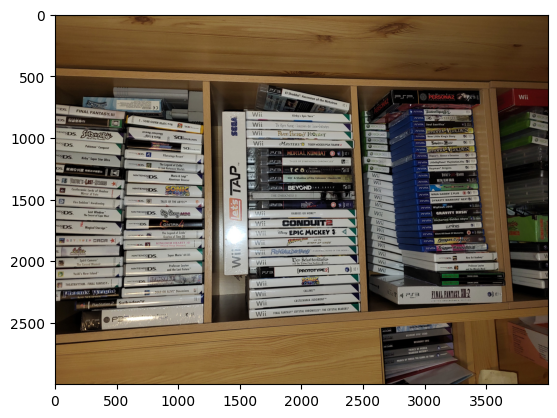

In [29]:
img = image.load_img("images/game_shelf.jpg")#.rotate(-90)
plt.imshow(img)

In [ ]:
#!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="SaqclrfpkPkAMpCYuawj")
project = rf.workspace("lucian-marshall").project("video-game-shelf-labeling-v2")
dataset = project.version(1).download("yolov8")


In [ ]:
model.train(data="data.yaml", epochs=30, batch=4)

In [39]:

results = model.predict(img,conf=0.01,save_crop=True,show_labels=False, show_conf=False,boxes=False)


0: 480x640 61 PS2s, 171 Video-Games, 30 Xboxs, 38 Xbox Ones, 607.0ms
Speed: 3.9ms preprocess, 607.0ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs/detect/predict3


In [44]:
result = results[0]
print(len(result.boxes))

300


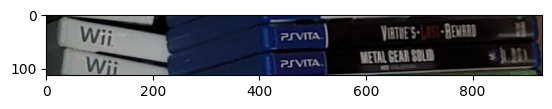

Object type: Video-Game
Coordinates: [2509, 1269, 3440, 1382]
Probability: 0.08
---


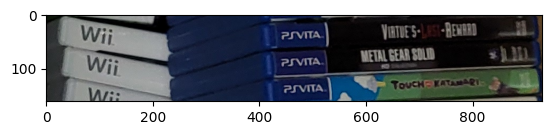

Object type: Video-Game
Coordinates: [2508, 1271, 3439, 1433]
Probability: 0.08
---


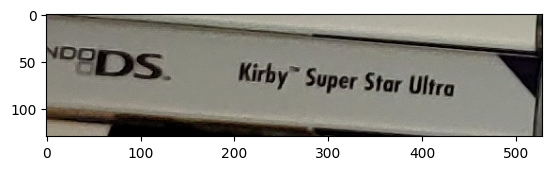

Object type: PS2
Coordinates: [11, 1105, 539, 1235]
Probability: 0.08
---


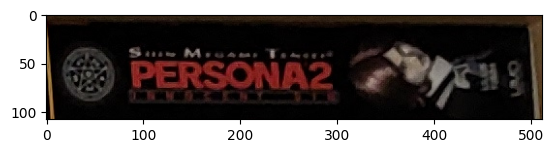

Object type: PS2
Coordinates: [2944, 610, 3456, 718]
Probability: 0.08
---


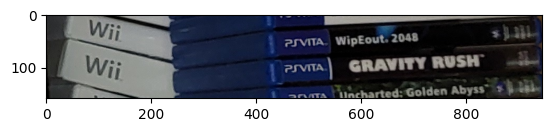

Object type: Video-Game
Coordinates: [2515, 1517, 3460, 1676]
Probability: 0.08
---


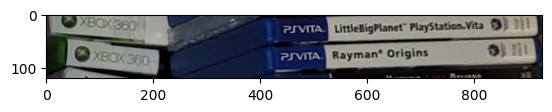

Object type: Video-Game
Coordinates: [2501, 1176, 3429, 1295]
Probability: 0.08
---


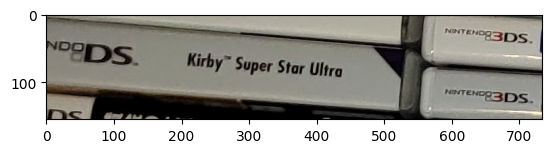

Object type: Video-Game
Coordinates: [7, 1100, 741, 1255]
Probability: 0.07
---


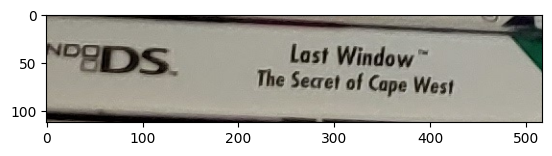

Object type: PS2
Coordinates: [14, 1563, 531, 1675]
Probability: 0.07
---


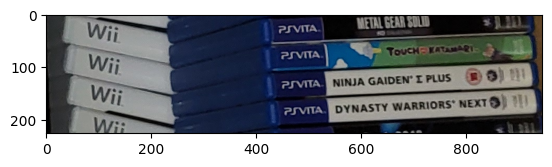

Object type: Video-Game
Coordinates: [2506, 1332, 3452, 1558]
Probability: 0.07
---


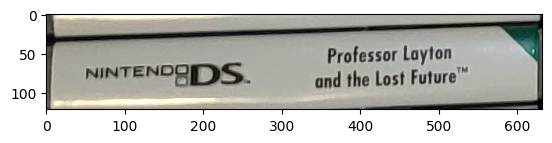

Object type: Video-Game
Coordinates: [567, 1989, 1199, 2110]
Probability: 0.07
---


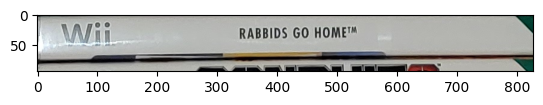

Object type: Video-Game
Coordinates: [1581, 1585, 2408, 1679]
Probability: 0.07
---


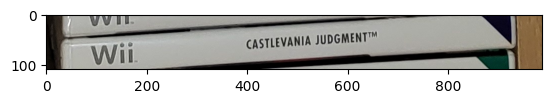

Object type: Xbox One
Coordinates: [1543, 2266, 2531, 2375]
Probability: 0.07
---


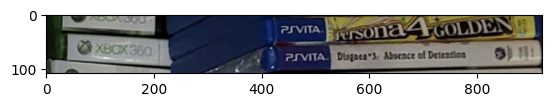

Object type: Video-Game
Coordinates: [2496, 1072, 3417, 1180]
Probability: 0.07
---


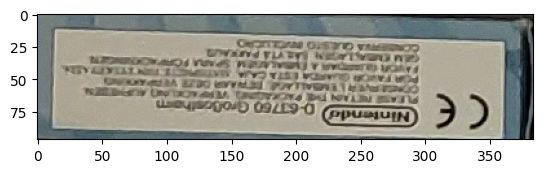

Object type: Xbox
Coordinates: [486, 684, 870, 781]
Probability: 0.07
---


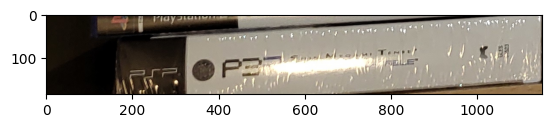

Object type: Video-Game
Coordinates: [54, 2350, 1205, 2534]
Probability: 0.07
---


In [55]:
for box in result.boxes[100:115]:
    label = result.names[box.cls[0].item()]
    cords = [round(x) for x in box.xyxy[0].tolist()]
    x1=cords[1]
    x2=cords[3]
    y1=cords[0]
    y2=cords[2]
    plt.imshow(Image.fromarray(result.plot(boxes=False)[x1:x2,y1:y2,::-1]))
    plt.show()
    prob = round(box.conf[0].item(),2)
    print("Object type:", label)
    print("Coordinates:", cords)
    print("Probability:", prob)
    print("---")

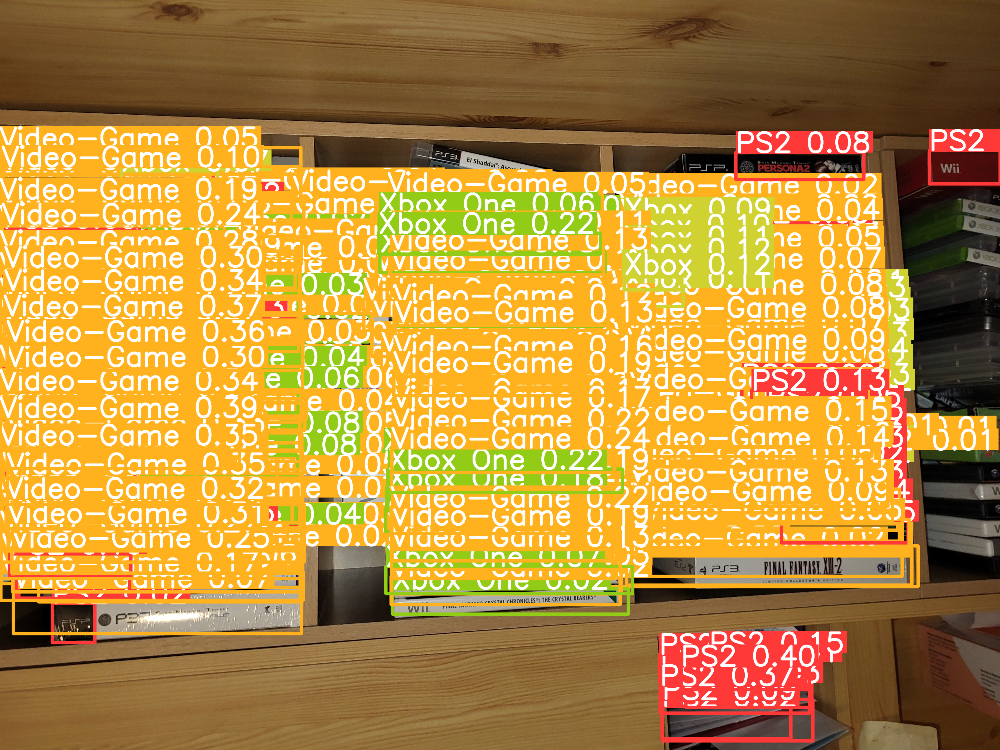

In [47]:
Image.fromarray(results[0].plot(boxes=True)[:,:,::-1])

### Sources:

https://www.freecodecamp.org/news/how-to-detect-objects-in-images-using-yolov8/


https://docs.ultralytics.com/modes/predict/#inference-sources


https://universe.roboflow.com/lucian-marshall/video-game-shelf-labeling-v2